# Introduction

In this notebook we will explore important financial concepts which include:

- Linearity in Finance
- Nonlinearity in Finance
- Numerical Methods for Pricing Options
- Modeling Interest Rates and Derivatives
- Statistical Analysis of Time Series Data

Note that these are taken from the book from James Ma Weiming “Mastering Python for Finance - Second Edition.” and I might chose not to cover all the concept that are laid out in said book without explicit clarification.

## Linearity

### The Capital Asset Pricing Model and the Security Market Line

The Capital Asset Pricing Model (CAPM) describes the relationship between risk and rates of return of a security as:

$$ R_i = R_f + \beta_i \left( E\left[ R_{mkt}\right] - R_f\right) $$

where

- $R_i$ is the return of security $i$
- $\beta_i$ is a measure for the systematic risk of a security $i$. This describes the sensitivity of stock returns with respect to movements of the market. If $\beta_i$ is zero, then the security generates no excess returns regardless of the direction the market moves in. It can only grow at a risk-free rate. A stock with a beta of 1 indicates that the stock moves perfectly with the market. See the Udemy course Python for Finance: Investment Fundamentals & Data Analytics (https://www.udemy.com/course/python-for-finance-investment-fundamentals-data-analytics/) for a thorough and colorful explanation of $\beta$.
- $R_f$ is the risk-free rate, e.g., a government bond
- $\left( E\left[ R_{mkt}\right] - R_f\right)$ is the market risk premium, which is the return expected from the market above the risk-free rate. 

The result should give an investor the required return or discount rate they can use to find the value of an asset. The goal of the CAPM formula is to evaluate whether a stock is fairly valued when its risk and the time value of money are compared to its expected return.

$\beta$ is mathematically derived by dividing the covariance of returns between the stock and the market by the variance of the market returns.

Using the CAPM to build a portfolio is supposed to help an investor manage their risk. If an investor were able to use the CAPM to perfectly optimize a portfolio’s return relative to risk, it would exist on a curve called the efficient frontier. An investor who wishes to receive a particular return would own one such combination of an optimal portfolio that provides the least risk possible. Combinations of optimal portfolios lie along a line called the efficient frontier. An illustration of this line can be found here: https://www.investopedia.com/terms/c/capm.asp#:~:text=The%20Capital%20Asset%20Pricing%20Model%20(CAPM)%20describes%20the%20relationship%20between,assets%20and%20cost%20of%20capital.


#### Finding the $\beta$ of a security

We can find the $\beta$ of a security by regressing the company's stock returns, $R_i$, against the market's returns, $R_M$, along with an intercept, $\alpha$:
$$R_i = \alpha + \beta \cdot R_M$$


A beta coefficient can measure the volatility of an individual stock compared to the systematic risk of the entire market. In statistical terms, beta represents the slope of the line through a regression of data points. In finance, each of these data points represents an individual stock's returns against those of the market as a whole.

Beta effectively describes the activity of a security's returns as it responds to swings in the market. A security's beta is calculated by dividing the product of the covariance of the security's returns and the market's returns by the variance of the market's returns over a specified period.

$$\beta=\frac{Cov\left( R_i, R_m\right)}{Var\left(R_m\right)}$$

In [18]:
from scipy import stats

stock_returns = [0.065, 0.0265, -0.0593, -0.001, 0.0346]
mkt_returns = [0.055, -0.09, -0.041, 0.045, 0.022]
beta, alpha, r_value, p_value, std_err = stats.linregress(stock_returns, mkt_returns)

beta, alpha

(0.5077431878770808, -0.008481900352462384)

In [80]:
import os
import pandas as pd
import numpy as np
import scipy
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from IPython.display import set_matplotlib_formats
import seaborn as sns
set_matplotlib_formats('svg')

def load_coins():
    folder = f'../02.Prepared_data/2021-04-05/'

    ETH = pd.read_csv(f"{folder}/ETH_Ethereum.csv", index_col=0, parse_dates=['date'])
    XMR = pd.read_csv(f"{folder}/XMR_Monero.csv", index_col=0, parse_dates=['date'])
    DASH = pd.read_csv(f"{folder}/DASH_Dash.csv", index_col=0, parse_dates=['date'])
    LTC = pd.read_csv(f"{folder}/LTC_Litecoin.csv", index_col=0, parse_dates=['date'])
    XRP = pd.read_csv(f"{folder}/XRP_XRP.csv", index_col=0, parse_dates=['date'])
    ADA = pd.read_csv(f"{folder}/ADA_Cardano.csv", index_col=0, parse_dates=['date'])
    DOT = pd.read_csv(f"{folder}/DOT_Polkadot.csv", index_col=0, parse_dates=['date'])

    coins = [ETH, XMR, DASH, LTC, XRP, ADA, DOT]
    # make sure that all have date as index
    new_coins = []
    for df in coins:
        df = df.sort_values(by='date')
        df = df.drop_duplicates(subset='date', keep='first')
        df = df.set_index('date', drop=True)
        df = df.asfreq('D', method='ffill')
        new_coins.append(df)

    coins = [BTC] + new_coins

    cols = ['BTC', 'ETH', 'XMR', 'DASH', 'LTC', 'XRP', 'ADA', 'DOT']
    df = pd.DataFrame()

    for col, coin in zip(cols, coins):
        vals = coin['close'].asfreq('D', method='ffill') # in case there were some skipped days
        df[col] = vals
        
    return df

In [45]:
df = load_coins()

df = df[['BTC', 'ETH', 'XMR', 'DASH', 'LTC', 'XRP', 'ADA']]

# Set to min date that is where ADA starts
mask = df['ADA'] > 0
min_date = df['ADA'][mask].index.min()
df = df[ df.index >= min_date ]

df.head()

,BTC,ETH,XMR,DASH,LTC,XRP,ADA
date,,,,,,,
2017-10-01,4403.74,302.34,93.22,315.80,54.54,0.206532,0.024969
2017-10-02,4409.32,297.48,91.54,308.68,53.38,0.202676,0.025932
2017-10-03,4317.48,292.46,92.96,296.23,52.35,0.203318,0.020816
2017-10-04,4229.36,292.66,90.41,305.46,51.40,0.214774,0.021931
2017-10-05,4328.41,295.86,91.86,305.40,51.67,0.237016,0.021489


Normalizing Data

I’m going to use logarithmic returns, since it’s more convenient and it takes care of the normalization for the rest of the project. Converting everything to logarithmic returns is simple. Think of it as the log of an arithmetic daily return (which is obtained by dividing the price at day n, by the price at day n-1).

In [46]:
log_ret = np.log(df/df.shift(1))
log_ret.head()

,BTC,ETH,XMR,DASH,LTC,XRP,ADA
date,,,,,,,
2017-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-10-02,0.001266,-0.016205,-0.018186,-0.022804,-0.021498,-0.018847,0.037843
2017-10-03,-0.021049,-0.017019,0.015393,-0.041169,-0.019484,0.003163,-0.219756
2017-10-04,-0.020621,0.000684,-0.027814,0.030683,-0.018314,0.054815,0.052179
2017-10-05,0.023150,0.010875,0.015911,-0.000196,0.005239,0.098541,-0.020360


In [76]:
np.random.seed(42)
num_ports = 50000
all_weights = np.zeros((num_ports, len(df.columns)))
ret_arr = np.zeros(num_ports)
vol_arr = np.zeros(num_ports)
sharpe_arr = np.zeros(num_ports)

for x in range(num_ports):
    # Weights
    weights = np.array(np.random.random(len(df.columns)))
    weights = weights/np.sum(weights)
    
    # Save weights
    all_weights[x,:] = weights
    
    # Expected yearly-return
    ret_arr[x] = np.sum((log_ret.mean() * weights * 365))
    
    # Expected volatility
    vol_arr[x] = np.sqrt(np.dot(weights.T, np.dot(log_ret.cov()*365, weights)))
    
    # Sharpe Ratio
    sharpe_arr[x] = ret_arr[x]/vol_arr[x]

In [77]:
print(f"Max Sharpe Ratio in the array: {sharpe_arr.max()}")
print(f"It's location in the array: {sharpe_arr.argmax()}")

Max Sharpe Ratio in the array: 0.8719852716365526
It's location in the array: 13170


In [78]:
print(all_weights[sharpe_arr.argmax(),:])

max_sr_ret = ret_arr[sharpe_arr.argmax()]
max_sr_vol = vol_arr[sharpe_arr.argmax()]

[0.47192516 0.02789861 0.0616363  0.00981197 0.03588324 0.03148519
 0.36135954]


In [79]:
for c,w in zip(df.columns, all_weights[sharpe_arr.argmax(),:]):
    print(f"Coin {c}: {w*100:.2f}%")

Coin BTC: 47.19%
Coin ETH: 2.79%
Coin XMR: 6.16%
Coin DASH: 0.98%
Coin LTC: 3.59%
Coin XRP: 3.15%
Coin ADA: 36.14%


In [82]:
plt.figure(figsize=(12,8))
plt.scatter(vol_arr, ret_arr, c=sharpe_arr, cmap='viridis')
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility')
plt.ylabel('Return')
plt.scatter(max_sr_vol, max_sr_ret,c='red', s=50) # red dot
plt.show()

In [65]:
def get_ret_vol_sr(weights):
    weights= np.array(weights)
    ret=np.sum(log_ret.mean() * weights)*365
    vol=np.sqrt(np.dot(weights.T, np.dot(log_ret.cov()*365, weights)))
    sr=ret/vol
    return np.array([ret, vol, sr])

def neg_sharpe(weights):
    return get_ret_vol_sr(weights)[2]*-1

def check_sum(weights):
    return np.sum(weights)-1

In [66]:
#constraints
cons = ({'type':'eq', 'fun': check_sum})
n_cols=len(log_ret.columns)
#bounds
bnds = (((0,1),)*n_cols)
#initial guess
init_guess = [np.repeat((1/n_cols),n_cols)]

In [67]:
opt_results = minimize(neg_sharpe, init_guess, method = 'SLSQP', bounds = bnds, constraints = cons)
print(opt_results)

     fun: -0.9768897040690181
     jac: array([ 8.00415874e-05,  2.81338014e-01,  5.64537659e-01,  9.49208923e-01,
        4.95536201e-01,  4.90423650e-01, -2.68496573e-04])
 message: 'Optimization terminated successfully'
    nfev: 56
     nit: 7
    njev: 7
  status: 0
 success: True
       x: array([7.70383824e-01, 0.00000000e+00, 0.00000000e+00, 1.48102017e-16,
       0.00000000e+00, 1.67400815e-16, 2.29616176e-01])


In [68]:
opt_results.x

array([7.70383824e-01, 0.00000000e+00, 0.00000000e+00, 1.48102017e-16,
       0.00000000e+00, 1.67400815e-16, 2.29616176e-01])

In [69]:
# return, volatility, and sharpe ratio
get_ret_vol_sr(opt_results.x)

array([0.82473834, 0.84424919, 0.9768897 ])

In [70]:
frontier_y = np.linspace(0.2,0.9,200)

In [71]:
def minimize_volatility(weights):
    return get_ret_vol_sr(weights)[1]

In [72]:
frontier_x = []

for possible_return in frontier_y:
    cons = ({'type':'eq', 'fun':check_sum},
            {'type':'eq', 'fun': lambda w: get_ret_vol_sr(w)[0] - possible_return})
    
    result = minimize(minimize_volatility,init_guess,method='SLSQP', bounds=bnds, constraints=cons)
    frontier_x.append(result['fun'])

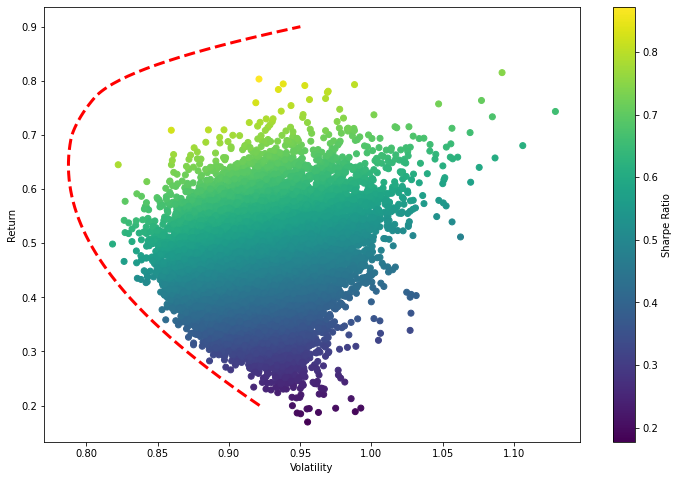

In [73]:
plt.figure(figsize=(12,8))
plt.scatter(vol_arr, ret_arr, c=sharpe_arr, cmap='viridis')
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility')
plt.ylabel('Return')
plt.plot(frontier_x,frontier_y, 'r--', linewidth=3)
plt.show()